In [1]:
import cv2
import numpy as np
from PIL import Image
import random
import os
import glob

In [2]:
class CircleMaskAugmentor:
    def __init__(self, img_path, output_dir_mask='masks', output_dir_aug='stat_rotating_background'):
        self.img_path = img_path
        self.img_name = self.extract_img_name(img_path)
        self.output_dir_mask = output_dir_mask
        self.output_dir_aug = output_dir_aug
        os.makedirs(output_dir_mask, exist_ok=True)
        os.makedirs(output_dir_aug, exist_ok=True)

        self.img = cv2.imread(img_path)
        self.img_display = self.img.copy()
        self.circles = []

    def extract_img_name(self, path):
        filename = os.path.basename(path)
        filename_no_ext = os.path.splitext(filename)[0]
        return filename_no_ext[-4:]

    def draw_circles(self):
        cv2.namedWindow('Draw Circles')
        cv2.setMouseCallback('Draw Circles', self._draw_circle_callback)

        while True:
            cv2.imshow('Draw Circles', self.img_display)
            key = cv2.waitKey(1) & 0xFF
            if key == ord('q'):
                break
            elif key == ord('u'):
                if self.circles:
                    self.circles.pop()
                    self.img_display = self.img.copy()
                    for c in self.circles:
                        cv2.circle(self.img_display, (c[0], c[1]), c[2], (0, 255, 0), 2)

        cv2.destroyAllWindows()
        cv2.waitKey(500)

        # Save the mask
        mask = np.zeros(self.img.shape[:2], dtype=np.uint8)
        for c in self.circles:
            cv2.circle(mask, (c[0], c[1]), c[2], 255, -1)
        mask_path = os.path.join(self.output_dir_mask, f'{self.img_name}_mask.png')
        cv2.imwrite(mask_path, mask)

        print(f"Saved mask for {self.img_name} at {mask_path}")

    def _draw_circle_callback(self, event, x, y, flags, param):
        if event == cv2.EVENT_LBUTTONDOWN:
            self.circles.append((x, y, 0))
        elif event == cv2.EVENT_MOUSEMOVE and self.circles:
            radius = int(np.sqrt((self.circles[-1][0] - x)**2 + (self.circles[-1][1] - y)**2))
            self.circles[-1] = (self.circles[-1][0], self.circles[-1][1], radius)
            self.img_display = self.img.copy()
            for c in self.circles:
                cv2.circle(self.img_display, (c[0], c[1]), c[2], (0, 255, 0), 2)
        elif event == cv2.EVENT_LBUTTONUP:
            radius = int(np.sqrt((self.circles[-1][0] - x)**2 + (self.circles[-1][1] - y)**2))
            self.circles[-1] = (self.circles[-1][0], self.circles[-1][1], radius)
            self.img_display = self.img.copy()
            for c in self.circles:
                cv2.circle(self.img_display, (c[0], c[1]), c[2], (0, 255, 0), 2)

    def augment_background(self, n_rotations=10, angle_range=(10, 100)):
        mask_path = os.path.join(self.output_dir_mask, f'{self.img_name}_mask.png')
        mask = cv2.imread(mask_path, 0)
        background_mask = cv2.bitwise_not(mask)

        foreground = cv2.bitwise_and(self.img, self.img, mask=mask)

        (h, w) = self.img.shape[:2]
        center = (w // 2, h // 2)
        angles = np.linspace(angle_range[0], angle_range[1], n_rotations)

        for i, angle in enumerate(angles):
            rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
            rotated_background = cv2.warpAffine(
                self.img, rotation_matrix, (w, h), borderMode=cv2.BORDER_REFLECT
            )
            new_background = cv2.bitwise_and(rotated_background, rotated_background, mask=background_mask)
            combined_image = cv2.add(foreground, new_background)

            save_path = os.path.join(self.output_dir_aug, f'{self.img_name}_aug_{i:03d}.jpeg')
            cv2.imwrite(save_path, combined_image)

        print(f"Saved {n_rotations} augmented images for {self.img_name}")


In [ ]:
# Example usage:
if __name__ == '__main__':
    # Process all images in a folder
    input_dir = 'NGVS_images_allrank1rank2'
    all_images = glob.glob(os.path.join(input_dir, '*.jpeg'))

    for img_path in all_images:
        augmentor = CircleMaskAugmentor(img_path)
        augmentor.draw_circles()      # Draw and save mask
        augmentor.augment_background()  # Augment and save rotated images

2025-04-27 15:17:44.717 python[59298:16927305] +[IMKClient subclass]: chose IMKClient_Modern
2025-04-27 15:17:44.717 python[59298:16927305] +[IMKInputSession subclass]: chose IMKInputSession_Modern


Saved mask for BC18 at masks/BC18_mask.png
Saved 10 augmented images for BC18
Saved mask for BC34 at masks/BC34_mask.png
Saved 10 augmented images for BC34
Saved mask for BC22 at masks/BC22_mask.png
Saved 10 augmented images for BC22
Saved mask for BC43 at masks/BC43_mask.png
Saved 10 augmented images for BC43
Saved mask for _BC7 at masks/_BC7_mask.png
Saved 10 augmented images for _BC7
Saved mask for BC38 at masks/BC38_mask.png
Saved 10 augmented images for BC38
Saved mask for BC39 at masks/BC39_mask.png
Saved 10 augmented images for BC39
Saved mask for BC15 at masks/BC15_mask.png
Saved 10 augmented images for BC15
Saved mask for _BC6 at masks/_BC6_mask.png
Saved 10 augmented images for _BC6
Saved mask for BC42 at masks/BC42_mask.png
Saved 10 augmented images for BC42
Saved mask for BC35 at masks/BC35_mask.png
Saved 10 augmented images for BC35
Saved mask for BC45 at masks/BC45_mask.png
Saved 10 augmented images for BC45
Saved mask for _BC1 at masks/_BC1_mask.png
Saved 10 augmented im

: 

Displaying image: stat_rotating_background/augmented_image_000.png


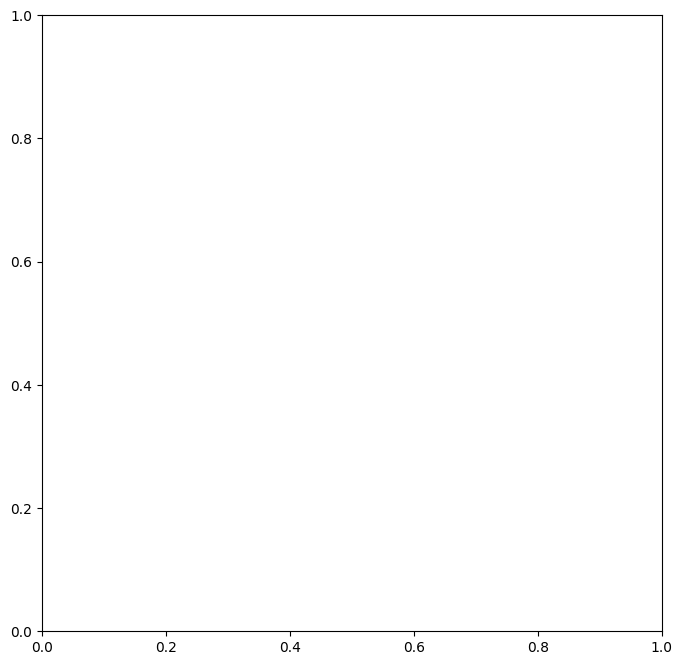

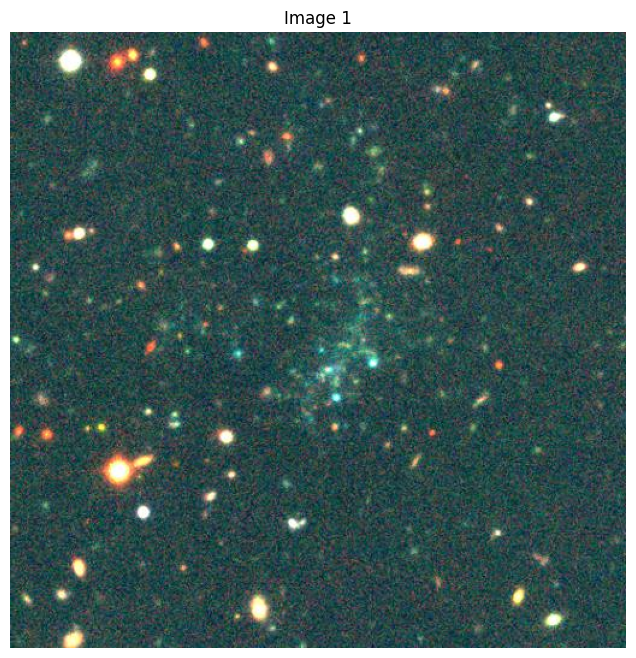

Displaying image: stat_rotating_background/augmented_image_001.png


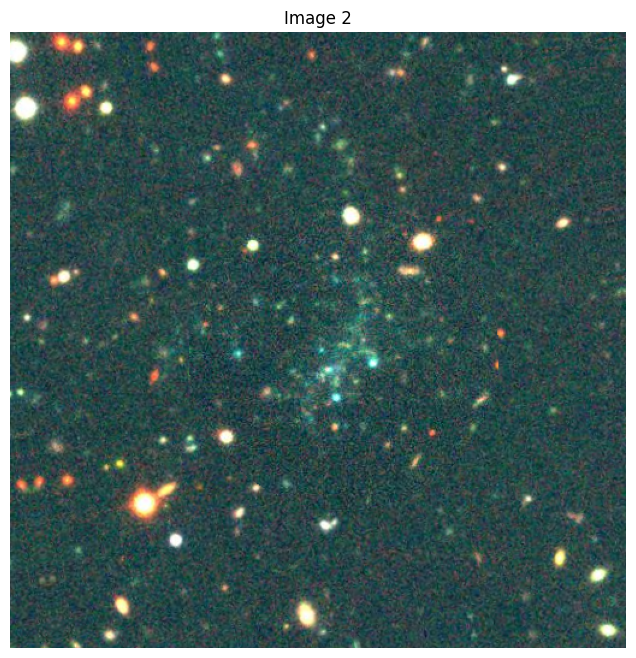

Displaying image: stat_rotating_background/augmented_image_002.png


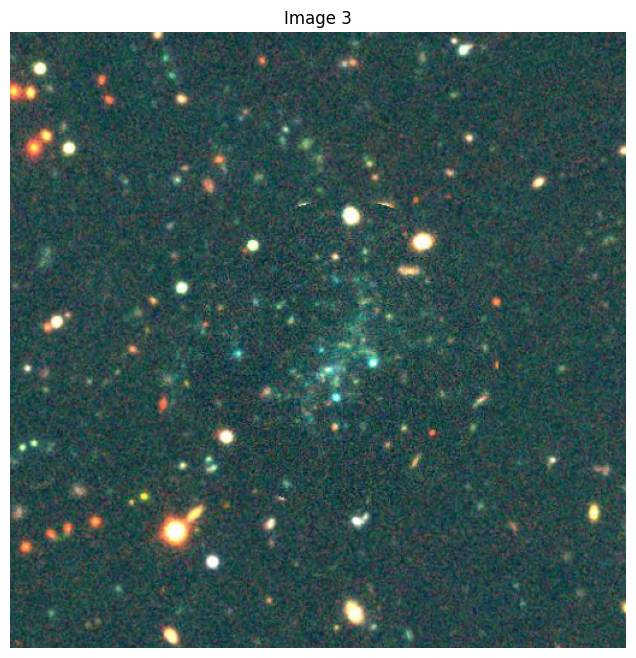

Displaying image: stat_rotating_background/augmented_image_003.png


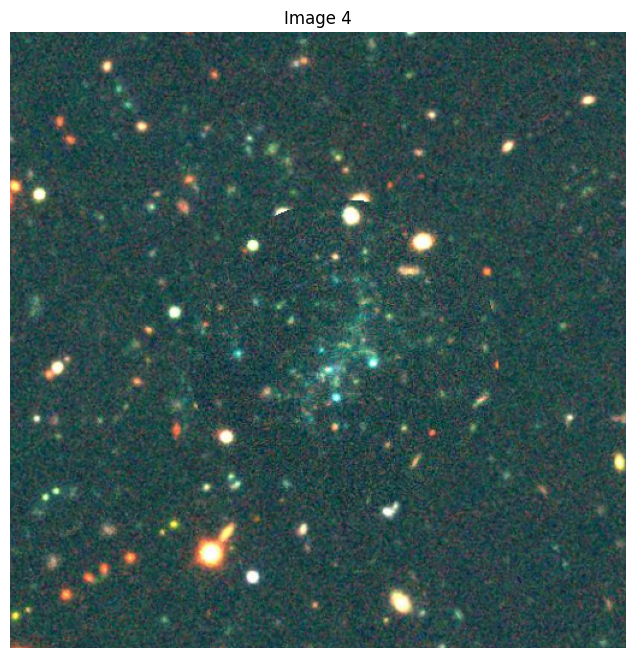

Displaying image: stat_rotating_background/augmented_image_004.png


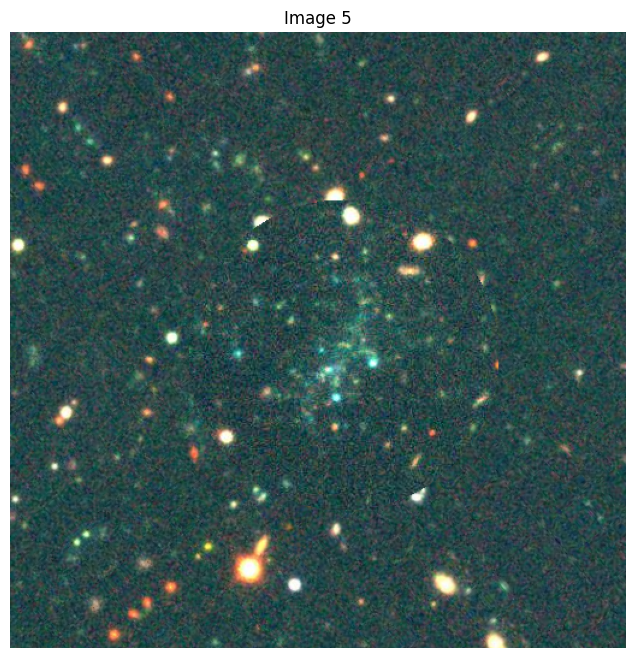

Displaying image: stat_rotating_background/augmented_image_005.png


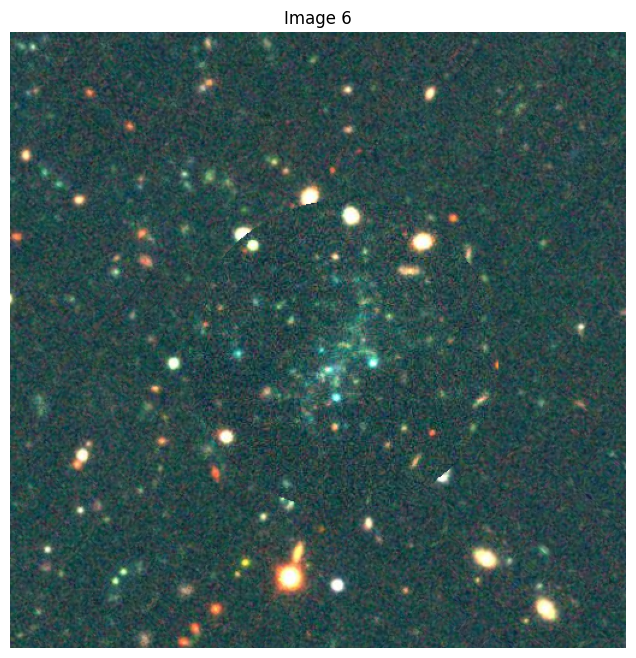

Displaying image: stat_rotating_background/augmented_image_006.png


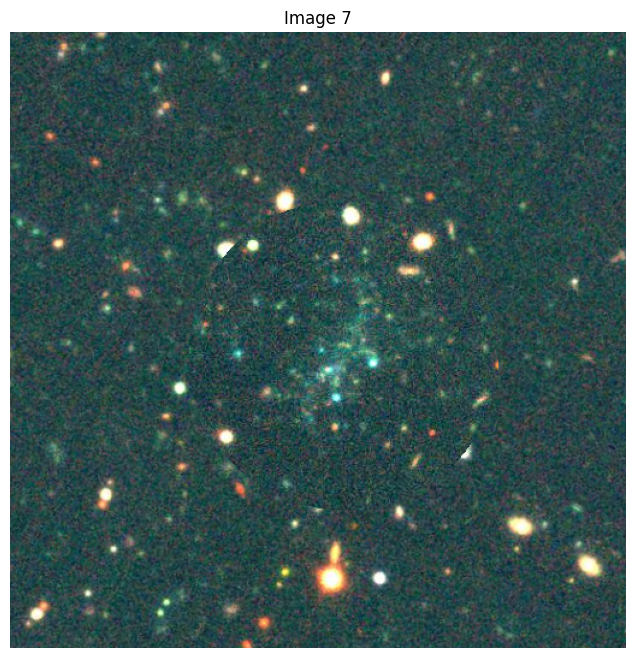

Displaying image: stat_rotating_background/augmented_image_007.png


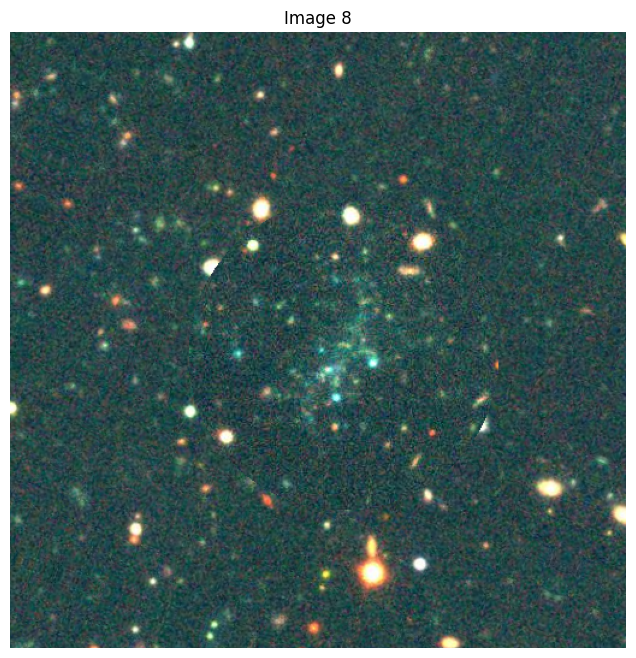

Displaying image: stat_rotating_background/augmented_image_008.png


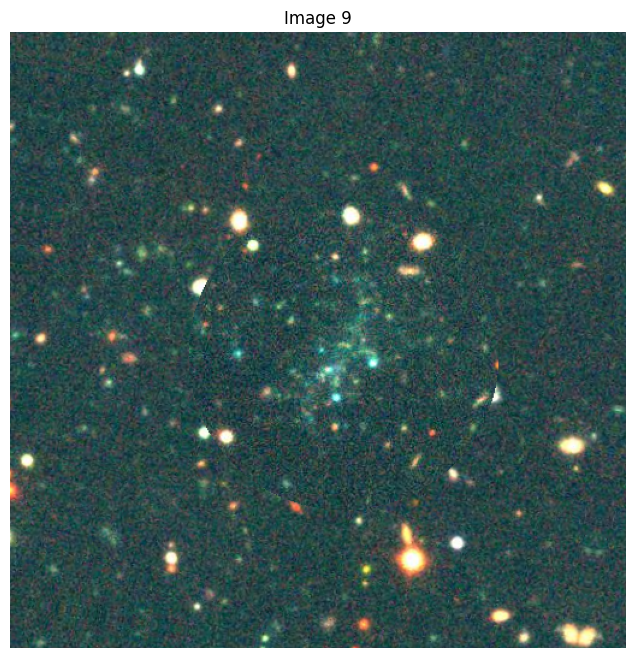

Displaying image: stat_rotating_background/augmented_image_009.png


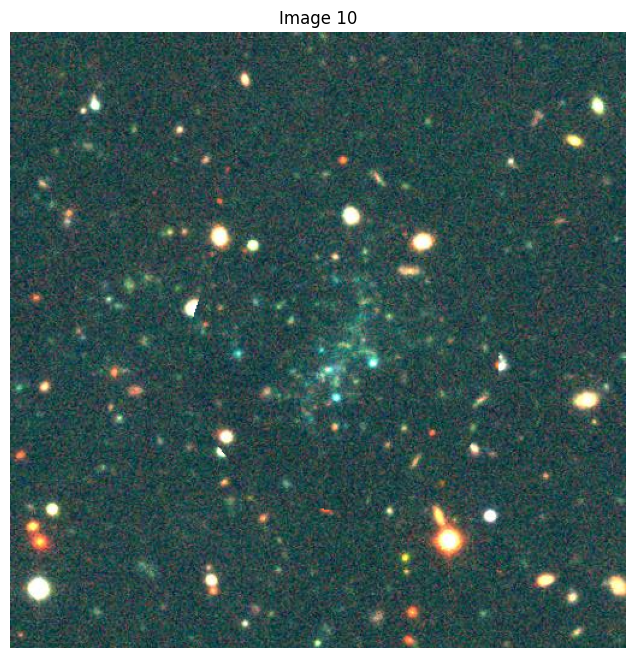

In [24]:
# plot images 
import matplotlib.pyplot as plt
import os
import glob
import matplotlib.image as mpimg

# Set the directory containing the images
directory = 'stat_rotating_background'
# Get a list of all image files in the directory
image_files = glob.glob(os.path.join(directory, '*.png'))
# Sort the image files
image_files.sort()
# Set up the figure and axis
fig, ax = plt.subplots(figsize=(8, 8))
# Loop through the image files and display them
for i, image_file in enumerate(image_files):
    img = mpimg.imread(image_file)
    print(f"Displaying image: {image_file}")
    fig, ax = plt.subplots(figsize=(8, 8))  # Create a new figure each time
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'Image {i+1}')
    plt.show(block=False)
    plt.pause(0.5)  # Show each image for 0.5 seconds
    plt.close(fig)  # Close the figure